In [2]:
import csv
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
import matplotlib.pyplot as plt

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)
csv_file = "amazon.csv"

# Read the CSV data and create a dictionary of products
products_dict = {}
with open(csv_file, mode='r', encoding='utf-8') as file:
    csv_reader = csv.DictReader(file)
    for row in csv_reader:
        rating_count = int(row['rating_count'].replace(',', '')) if row['rating_count'] else 0
        try:
            rating = float(row['rating'])
        except ValueError:
            rating = 0.0
        product_details = {
            'product_id': row['product_id'],
            'product_name': row['product_name'],
            'category': row['category'],
            'rating': rating,
            'rating_count': rating_count,
            'about_product': row['about_product']
        }
        products_dict[row['product_id']] = product_details

# Construct the grid
grid_size = len(products_dict)
grid = np.empty((grid_size, grid_size), dtype=object)

# Calculate row indices
categories = np.array([p['category'] for p in products_dict.values()]).reshape(-1, 1)
category_encoded = encoder.fit_transform(categories)

features = np.array([[p['rating'], p['rating_count']] for p in products_dict.values()])
features = np.concatenate((category_encoded, features), axis=1)

scaler = MinMaxScaler()
row_indices = scaler.fit_transform(features)

# Calculate column indices
vectorizer = TfidfVectorizer()
text_features = vectorizer.fit_transform([p['about_product'] for p in products_dict.values()])
column_indices = scaler.fit_transform(text_features.toarray())

# Place products in the grid based on row and column indices
for product_id, row_index, col_index in zip(products_dict.keys(), row_indices, column_indices):
    row = int(row_index * (grid_size - 1))
    col = int(col_index * (grid_size - 1))
    grid[row, col] = product_id

# A* search functions
def calculate_similarity(product1, product2):
    vectorizer = TfidfVectorizer()
    text_vectors = vectorizer.fit_transform([product1['about_product'], product2['about_product']])
    cosine_sim = cosine_similarity(text_vectors[0:1], text_vectors[1:2])[0][0]
    rating_similarity = min(product1['rating'], product2['rating']) / max(product1['rating'], product2['rating'])
    rating_count_similarity = min(product1['rating_count'], product2['rating_count']) / max(product1['rating_count'], product2['rating_count'])
    similarity_score = cosine_sim + rating_similarity + rating_count_similarity
    return similarity_score

def a_star_search(start, goal, grid, products_dict):
    from heapq import heappush, heappop
    def heuristic(product1, product2):
        return calculate_similarity(products_dict[product1], products_dict[product2])

    open_set = []
    heappush(open_set, (0, start))
    came_from = {}
    g_score = {product: float('inf') for row in grid for product in row if product}
    g_score[start] = 0
    f_score = {product: float('inf') for row in grid for product in row if product}
    f_score[start] = heuristic(start, goal)

    while open_set:
        _, current = heappop(open_set)
        if current == goal:
            path = []
            while current in came_from:
                path.append(current)
                current = came_from[current]
            return path[::-1]
        for row in grid:
            for neighbor in row:
                if neighbor and neighbor != current:
                    tentative_g_score = g_score[current] + calculate_similarity(products_dict[current], products_dict[neighbor])
                    if tentative_g_score < g_score[neighbor]:
                        came_from[neighbor] = current
                        g_score[neighbor] = tentative_g_score
                        f_score[neighbor] = g_score[neighbor] + heuristic(neighbor, goal)
                        heappush(open_set, (f_score[neighbor], neighbor))
    return []

# Example usage of A* search
start_product_id = 'B001E4KFG0'  # Example start product ID
goal_product_id = 'B003L1ZYYM'  # Example goal product ID
path = a_star_search(start_product_id, goal_product_id, grid, products_dict)
print("Path from start to goal:", path)

# Visualization
plt.figure(figsize=(10, 10))
plt.imshow(np.full((grid_size, grid_size), np.nan), cmap='viridis', interpolation='none')  # Empty grid
plt.title('Product Grid Based on Hybrid Filtering and Embeddings')

for i in range(grid_size):
    plt.axhline(i - 0.5, color='gray', linewidth=0.5)
    plt.axvline(i - 0.5, color='gray', linewidth=0.5)

for (row, col), product_id in np.ndenumerate(grid):
    if product_id is not None:
        plt.text(col, row, product_id, ha='center', va='center', fontsize=8)

plt.xlabel('Embedding-based Column Index')
plt.ylabel('Hybrid Filtering-based Row Index')
plt.grid(False)
plt.show()


ModuleNotFoundError: No module named 'matplotlib'

In [6]:
import csv
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
import matplotlib.pyplot as plt
from sklearn.metrics import pairwise_distances
from gensim.models import Word2Vec

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)
csv_file = "amazon.csv"

# Read the CSV data and create a dictionary of products
products_dict = {}
with open(csv_file, mode='r', encoding='utf-8') as file:
    csv_reader = csv.DictReader(file)
    for row in csv_reader:
        rating_count = int(row['rating_count'].replace(',', '')) if row['rating_count'] else 0
        try:
            rating = float(row['rating'])
        except ValueError:
            rating = 0.0
        product_details = {
            'product_id': row['product_id'],
            'product_name': row['product_name'],
            'category': row['category'],
            'rating': rating,
            'rating_count': rating_count,
            'about_product': row['about_product']
        }
        products_dict[row['product_id']] = product_details

# Construct the grid
grid_size = int(np.ceil(np.sqrt(len(products_dict))))
grid = np.empty((grid_size, grid_size), dtype=object)

# Calculate row indices using hybrid filtering
categories = np.array([p['category'] for p in products_dict.values()]).reshape(-1, 1)
category_encoded = encoder.fit_transform(categories)

features = np.array([[p['rating'], p['rating_count']] for p in products_dict.values()])
features = np.concatenate((category_encoded, features), axis=1)

scaler = MinMaxScaler()
row_indices = scaler.fit_transform(features)

# Calculate column indices using Word2Vec embeddings for better semantic similarity
corpus = [p['about_product'].split() for p in products_dict.values()]
word2vec_model = Word2Vec(sentences=corpus, vector_size=50, window=5, min_count=1, workers=4)
product_vectors = np.array([np.mean([word2vec_model.wv[word] for word in words if word in word2vec_model.wv]
                                    or [np.zeros(50)], axis=0) for words in corpus])

column_indices = scaler.fit_transform(product_vectors)

# Place products in the grid based on row and column indices
for product_id, row_index, col_index in zip(products_dict.keys(), row_indices, column_indices):
    row = int(row_index[0] * (grid_size - 1))
    col = int(col_index[0] * (grid_size - 1))
    grid[row, col] = product_id

# A* search functions
def calculate_similarity(product1, product2):
    vectorizer = TfidfVectorizer()
    text_vectors = vectorizer.fit_transform([product1['about_product'], product2['about_product']])
    cosine_sim = cosine_similarity(text_vectors[0:1], text_vectors[1:2])[0][0]
    rating_similarity = min(product1['rating'], product2['rating']) / max(product1['rating'], product2['rating'])
    rating_count_similarity = min(product1['rating_count'], product2['rating_count']) / max(product1['rating_count'], product2['rating_count'])
    similarity_score = cosine_sim + rating_similarity + rating_count_similarity
    return similarity_score

def a_star_search(start, goal, grid, products_dict):
    from heapq import heappush, heappop
    def heuristic(product1, product2):
        return calculate_similarity(products_dict[product1], products_dict[product2])

    open_set = []
    heappush(open_set, (0, start))
    came_from = {}
    g_score = {product: float('inf') for row in grid for product in row if product}
    g_score[start] = 0
    f_score = {product: float('inf') for row in grid for product in row if product}
    f_score[start] = heuristic(start, goal)

    while open_set:
        _, current = heappop(open_set)
        if current == goal:
            path = []
            while current in came_from:
                path.append(current)
                current = came_from[current]
            return path[::-1]
        for row in grid:
            for neighbor in row:
                if neighbor and neighbor != current:
                    tentative_g_score = g_score[current] + calculate_similarity(products_dict[current], products_dict[neighbor])
                    if tentative_g_score < g_score[neighbor]:
                        came_from[neighbor] = current
                        g_score[neighbor] = tentative_g_score
                        f_score[neighbor] = g_score[neighbor] + heuristic(neighbor, goal)
                        heappush(open_set, (f_score[neighbor], neighbor))
    return []

# Example usage of A* search
start_product_id = 'B001E4KFG0'  # Example start product ID
goal_product_id = 'B003L1ZYYM'  # Example goal product ID
path = a_star_search(start_product_id, goal_product_id, grid, products_dict)
print("Path from start to goal:", path)

# Visualization
plt.figure(figsize=(10, 10))
plt.imshow(np.full((grid_size, grid_size), np.nan), cmap='viridis', interpolation='none')  # Empty grid
plt.title('Product Grid Based on Hybrid Filtering and Embeddings')

for i in range(grid_size):
    plt.axhline(i - 0.5, color='gray', linewidth=0.5)
    plt.axvline(i - 0.5, color='gray', linewidth=0.5)

for (row, col), product_id in np.ndenumerate(grid):
    if product_id is not None:
        plt.text(col, row, product_id, ha='center', va='center', fontsize=8)

plt.xlabel('Embedding-based Column Index')
plt.ylabel('Hybrid Filtering-based Row Index')
plt.grid(False)
plt.show()


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


KeyError: 'B001E4KFG0'

In [4]:

import csv
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
import matplotlib.pyplot as plt
from sklearn.metrics import pairwise_distances
from gensim.models import Word2Vec

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)
csv_file = "amazon.csv"

# Read the CSV data and create a dictionary of products
products_dict = {}
with open(csv_file, mode='r', encoding='utf-8') as file:
    csv_reader = csv.DictReader(file)
    for row in csv_reader:
        rating_count = int(row['rating_count'].replace(',', '')) if row['rating_count'] else 0
        try:
            rating = float(row['rating'])
        except ValueError:
            rating = 0.0
        product_details = {
            'product_id': row['product_id'],
            'product_name': row['product_name'],
            'category': row['category'],
            'rating': rating,
            'rating_count': rating_count,
            'about_product': row['about_product']
        }
        products_dict[row['product_id']] = product_details

# Construct the grid
grid_size = int(np.ceil(np.sqrt(len(products_dict))))
grid = np.empty((grid_size, grid_size), dtype=object)

# Calculate row indices using hybrid filtering
categories = np.array([p['category'] for p in products_dict.values()]).reshape(-1, 1)
category_encoded = encoder.fit_transform(categories)

features = np.array([[p['rating'], p['rating_count']] for p in products_dict.values()])
features = np.concatenate((category_encoded, features), axis=1)

scaler = MinMaxScaler()
row_indices = scaler.fit_transform(features)

# Calculate column indices using Word2Vec embeddings for better semantic similarity
corpus = [p['about_product'].split() for p in products_dict.values()]
word2vec_model = Word2Vec(sentences=corpus, vector_size=50, window=5, min_count=1, workers=4)
product_vectors = np.array([np.mean([word2vec_model.wv[word] for word in words if word in word2vec_model.wv]
                                    or [np.zeros(50)], axis=0) for words in corpus])

column_indices = scaler.fit_transform(product_vectors)

# Place products in the grid based on row and column indices
for product_id, row_index, col_index in zip(products_dict.keys(), row_indices, column_indices):
    row = int(row_index[0] * (grid_size - 1))
    col = int(col_index[0] * (grid_size - 1))
    grid[row, col] = product_id

# A* search functions
def calculate_similarity(product1, product2):
    vectorizer = TfidfVectorizer()
    text_vectors = vectorizer.fit_transform([product1['about_product'], product2['about_product']])
    cosine_sim = cosine_similarity(text_vectors[0:1], text_vectors[1:2])[0][0]
    rating_similarity = min(product1['rating'], product2['rating']) / max(product1['rating'], product2['rating'])
    rating_count_similarity = min(product1['rating_count'], product2['rating_count']) / max(product1['rating_count'], product2['rating_count'])
    similarity_score = cosine_sim + rating_similarity + rating_count_similarity
    return similarity_score

def a_star_search_recommendations(start, grid, products_dict, max_recommendations=10):
    from heapq import heappush, heappop
    def heuristic(product1, product2):
        return calculate_similarity(products_dict[product1], products_dict[product2])

    open_set = []
    heappush(open_set, (0, start))
    came_from = {}
    g_score = {product: float('inf') for row in grid for product in row if product}
    g_score[start] = 0
    f_score = {product: float('inf') for row in grid for product in row if product}
    f_score[start] = 0

    recommendations = []
    while open_set and len(recommendations) < max_recommendations:
        _, current = heappop(open_set)
        recommendations.append(current)
        for row in grid:
            for neighbor in row:
                if neighbor and neighbor != current:
                    tentative_g_score = g_score[current] + calculate_similarity(products_dict[current], products_dict[neighbor])
                    if tentative_g_score < g_score[neighbor]:
                        came_from[neighbor] = current
                        g_score[neighbor] = tentative_g_score
                        f_score[neighbor] = g_score[neighbor] + heuristic(neighbor, current)
                        heappush(open_set, (f_score[neighbor], neighbor))

    return recommendations

# Example usage of A* search for recommendations
start_product_id = 'B001E4KFG0'  # Example start product ID
recommendations = a_star_search_recommendations(start_product_id, grid, products_dict, max_recommendations=10)
print("Recommended products:", recommendations)

# Visualization
plt.figure(figsize=(10, 10))
plt.imshow(np.full((grid_size, grid_size), np.nan), cmap='viridis', interpolation='none')  # Empty grid
plt.title('Product Grid Based on Hybrid Filtering and Embeddings')

for i in range(grid_size):
    plt.axhline(i - 0.5, color='gray', linewidth=0.5)
    plt.axvline(i - 0.5, color='gray', linewidth=0.5)

for (row, col), product_id in np.ndenumerate(grid):
    if product_id is not None:
        plt.text(col, row, product_id, ha='center', va='center', fontsize=8)

plt.xlabel('Embedding-based Column Index')
plt.ylabel('Hybrid Filtering-based Row Index')
plt.grid(False)
plt.show()



[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: C:\Users\Dell\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


     ---------------------------------------- 0.0/162.8 kB ? eta -:--:--
     -------------- ------------------------ 61.4/162.8 kB 3.2 MB/s eta 0:00:01
     ---------------------- ---------------- 92.2/162.8 kB 1.1 MB/s eta 0:00:01
     ------------------------ ----------- 112.6/162.8 kB 930.9 kB/s eta 0:00:01
     ------------------------------- ---- 143.4/162.8 kB 774.0 kB/s eta 0:00:01
     ------------------------------------ 162.8/162.8 kB 751.3 kB/s eta 0:00:00
   ---------------------------------------- 0.0/8.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/8.0 MB ? eta -:--:--
   ---------------------------------------- 0.1/8.0 MB 656.4 kB/s eta 0:00:13
   ---------------------------------------- 0.1/8.0 MB 573.4 kB/s eta 0:00:14
    --------------------------------------- 0.1/8.0 MB 598.8 kB/s eta 0:00:14
    --------------------------------------- 0.1/8.0 MB 602.4 kB/s eta 0:00:14
    --------------------------------------- 0.2/8.0 MB 614.4 kB/s eta 0:00:13

Matplotlib is building the font cache; this may take a moment.
C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


KeyError: 'B001E4KFG0'

Invalid rating value: |


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Recommended products: ['B00DJ5N9VK', 'B09MB3DKG1', 'B0B3JSWG81', 'B09LMMFW3S', 'B09Y358DZQ', 'B07J9KXQCC', 'B097RN7BBK', 'B009P2LIL4', 'B0BHNHMR3H', 'B09H7JDJCW']


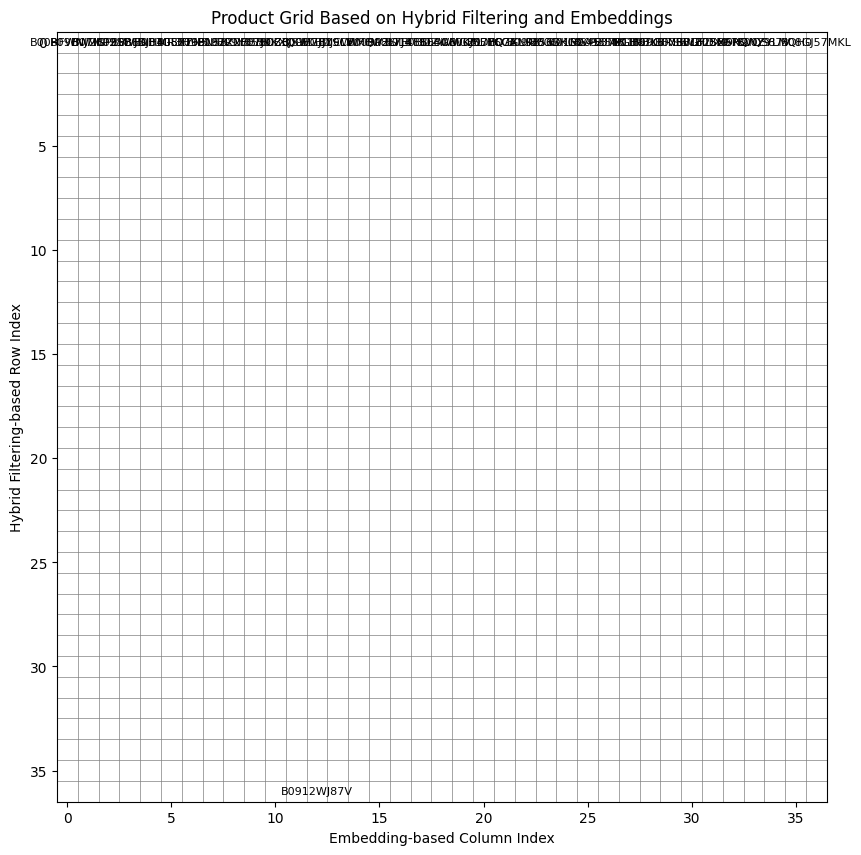

In [8]:
import csv
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
import matplotlib.pyplot as plt
from sklearn.metrics import pairwise_distances
from gensim.models import Word2Vec

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)
csv_file = "amazon.csv"

# Read the CSV data and create a dictionary of products
products_dict = {}
with open(csv_file, mode='r', encoding='utf-8') as file:
    csv_reader = csv.DictReader(file)
    for row in csv_reader:
        # Extract and clean the rating_count
        try:
            rating_count = int(row['rating_count'].replace(',', '')) if row['rating_count'] else 0
        except ValueError:
            print(f"Invalid rating_count value: {row['rating_count']}")
            rating_count = 0

        # Extract and clean the rating
        try:
            rating = float(row['rating'])
        except ValueError:
            print(f"Invalid rating value: {row['rating']}")
            rating = 0.0

        # Create a dictionary for each product
        product_details = {
            'product_id': row['product_id'],
            'product_name': row['product_name'],
            'category': row['category'],
            'rating': rating,
            'rating_count': rating_count,
            'about_product': row['about_product']
        }
        # Use product_id as the key for the products dictionary
        products_dict[row['product_id']] = product_details

# Construct the grid
grid_size = int(np.ceil(np.sqrt(len(products_dict))))
grid = np.empty((grid_size, grid_size), dtype=object)

# Calculate row indices using hybrid filtering
categories = np.array([p['category'] for p in products_dict.values()]).reshape(-1, 1)
category_encoded = encoder.fit_transform(categories)

features = np.array([[p['rating'], p['rating_count']] for p in products_dict.values()])
features = np.concatenate((category_encoded, features), axis=1)

scaler = MinMaxScaler()
row_indices = scaler.fit_transform(features)

# Calculate column indices using Word2Vec embeddings for better semantic similarity
corpus = [p['about_product'].split() for p in products_dict.values()]
word2vec_model = Word2Vec(sentences=corpus, vector_size=50, window=5, min_count=1, workers=4)
product_vectors = np.array([np.mean([word2vec_model.wv[word] for word in words if word in word2vec_model.wv]
                                    or [np.zeros(50)], axis=0) for words in corpus])

column_indices = scaler.fit_transform(product_vectors)

# Place products in the grid based on row and column indices
for product_id, row_index, col_index in zip(products_dict.keys(), row_indices, column_indices):
    row = int(row_index[0] * (grid_size - 1))
    col = int(col_index[0] * (grid_size - 1))
    grid[row, col] = product_id

# A* search functions
def calculate_similarity(product1, product2):
    vectorizer = TfidfVectorizer()
    text_vectors = vectorizer.fit_transform([product1['about_product'], product2['about_product']])
    cosine_sim = cosine_similarity(text_vectors[0:1], text_vectors[1:2])[0][0]
    rating_similarity = min(product1['rating'], product2['rating']) / max(product1['rating'], product2['rating'])
    rating_count_similarity = min(product1['rating_count'], product2['rating_count']) / max(product1['rating_count'], product2['rating_count'])
    similarity_score = cosine_sim + rating_similarity + rating_count_similarity
    return similarity_score

def a_star_search_recommendations(start, grid, products_dict, max_recommendations=10):
    from heapq import heappush, heappop
    def heuristic(product1, product2):
        return calculate_similarity(products_dict[product1], products_dict[product2])

    open_set = []
    heappush(open_set, (0, start))
    came_from = {}
    g_score = {product: float('inf') for row in grid for product in row if product}
    g_score[start] = 0
    f_score = {product: float('inf') for row in grid for product in row if product}
    f_score[start] = 0

    recommendations = []
    while open_set and len(recommendations) < max_recommendations:
        _, current = heappop(open_set)
        recommendations.append(current)
        for row in grid:
            for neighbor in row:
                if neighbor and neighbor != current:
                    tentative_g_score = g_score[current] + calculate_similarity(products_dict[current], products_dict[neighbor])
                    if tentative_g_score < g_score[neighbor]:
                        came_from[neighbor] = current
                        g_score[neighbor] = tentative_g_score
                        f_score[neighbor] = g_score[neighbor] + heuristic(neighbor, current)
                        heappush(open_set, (f_score[neighbor], neighbor))

    return recommendations

# Example usage of A* search for recommendations
start_product_id = 'B00DJ5N9VK'  # Example start product ID
recommendations = a_star_search_recommendations(start_product_id, grid, products_dict, max_recommendations=10)
print("Recommended products:", recommendations)

# Visualization
plt.figure(figsize=(10, 10))
plt.imshow(np.full((grid_size, grid_size), np.nan), cmap='viridis', interpolation='none')  # Empty grid
plt.title('Product Grid Based on Hybrid Filtering and Embeddings')

for i in range(grid_size):
    plt.axhline(i - 0.5, color='gray', linewidth=0.5)
    plt.axvline(i - 0.5, color='gray', linewidth=0.5)

for (row, col), product_id in np.ndenumerate(grid):
    if product_id is not None:
        plt.text(col, row, product_id, ha='center', va='center', fontsize=8)

plt.xlabel('Embedding-based Column Index')
plt.ylabel('Hybrid Filtering-based Row Index')
plt.grid(False)
plt.show()


Available product IDs: ['B07JW9H4J1', 'B098NS6PVG', 'B096MSW6CT', 'B08HDJ86NZ', 'B08CF3B7N1', 'B08Y1TFSP6', 'B08WRWPM22', 'B08DDRGWTJ', 'B008IFXQFU', 'B082LZGK39']


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Recommended products: ['B07JW9H4J1', 'B08L12N5H1', 'B0BNLFQDG2', 'B08HV83HL3', 'B0B4SJKRDF', 'B09GFLXVH9', 'B005FYNT3G', 'B09GFM8CGS', 'B09GFPN6TP', 'B09GFPVD9Y']


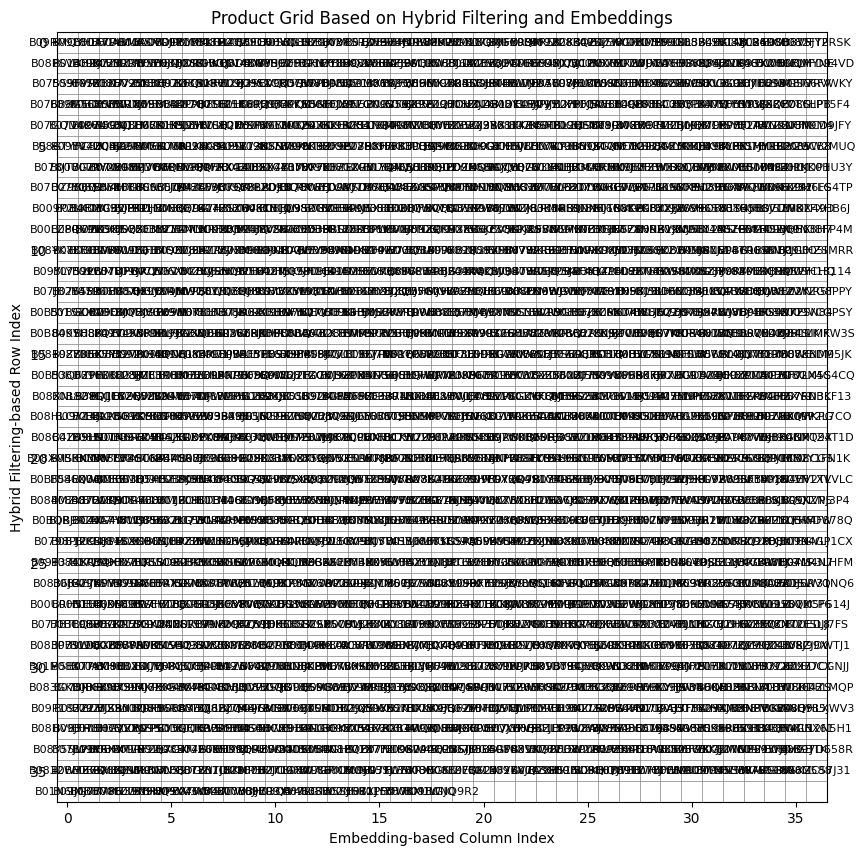

In [9]:
import csv
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
import random

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)
csv_file = "amazon.csv"

# Read the CSV data and create a dictionary of products
products_dict = {}
with open(csv_file, mode='r', encoding='utf-8') as file:
    csv_reader = csv.DictReader(file)
    for row in csv_reader:
        # Extract and clean the rating_count
        try:
            rating_count = int(row['rating_count'].replace(',', '')) if row['rating_count'] else 0
        except ValueError:
            rating_count = 0

        # Extract and clean the rating
        try:
            rating = float(row['rating'])
        except ValueError:
            rating = 0.0

        # Create a dictionary for each product
        product_details = {
            'product_id': row['product_id'],
            'product_name': row['product_name'],
            'category': row['category'],
            'rating': rating,
            'rating_count': rating_count,
            'about_product': row['about_product']
        }
        # Use product_id as the key for the products dictionary
        products_dict[row['product_id']] = product_details

# Print available product IDs
print("Available product IDs:", list(products_dict.keys())[:10])  # Print first 10 product IDs for checking

# Construct the grid
num_products = len(products_dict)
grid_size = int(np.ceil(np.sqrt(num_products)))
grid = np.empty((grid_size, grid_size), dtype=object)

# Calculate row indices using hybrid filtering
categories = np.array([p['category'] for p in products_dict.values()]).reshape(-1, 1)
category_encoded = encoder.fit_transform(categories)

features = np.array([[p['rating'], p['rating_count']] for p in products_dict.values()])
features = np.concatenate((category_encoded, features), axis=1)

scaler = MinMaxScaler()
row_indices = scaler.fit_transform(features)

# Calculate column indices using Word2Vec embeddings for better semantic similarity
corpus = [p['about_product'].split() for p in products_dict.values()]
word2vec_model = Word2Vec(sentences=corpus, vector_size=50, window=5, min_count=1, workers=4)
product_vectors = np.array([np.mean([word2vec_model.wv[word] for word in words if word in word2vec_model.wv]
                                    or [np.zeros(50)], axis=0) for words in corpus])

column_indices = scaler.fit_transform(product_vectors)

# Normalize indices to fit within grid size
row_indices = (row_indices[:, 0] * (grid_size - 1)).astype(int)
column_indices = (column_indices[:, 0] * (grid_size - 1)).astype(int)

# Shuffle the product IDs to ensure a random distribution
product_ids = list(products_dict.keys())
random.shuffle(product_ids)

# Place products in the grid based on normalized indices
for idx, product_id in enumerate(product_ids):
    row = row_indices[idx]
    col = column_indices[idx]
    while grid[row, col] is not None:
        col = (col + 1) % grid_size
        if col == 0:
            row = (row + 1) % grid_size
    grid[row, col] = product_id

# A* search functions
def calculate_similarity(product1, product2):
    vectorizer = TfidfVectorizer()
    text_vectors = vectorizer.fit_transform([product1['about_product'], product2['about_product']])
    cosine_sim = cosine_similarity(text_vectors[0:1], text_vectors[1:2])[0][0]
    rating_similarity = min(product1['rating'], product2['rating']) / max(product1['rating'], product2['rating'])
    rating_count_similarity = min(product1['rating_count'], product2['rating_count']) / max(product1['rating_count'], product2['rating_count'])
    similarity_score = cosine_sim + rating_similarity + rating_count_similarity
    return similarity_score

def a_star_search_recommendations(start, grid, products_dict, max_recommendations=10):
    from heapq import heappush, heappop
    def heuristic(product1, product2):
        return calculate_similarity(products_dict[product1], products_dict[product2])

    open_set = []
    heappush(open_set, (0, start))
    came_from = {}
    g_score = {product: float('inf') for row in grid for product in row if product}
    g_score[start] = 0
    f_score = {product: float('inf') for row in grid for product in row if product}
    f_score[start] = 0

    recommendations = []
    while open_set and len(recommendations) < max_recommendations:
        _, current = heappop(open_set)
        recommendations.append(current)
        for row in grid:
            for neighbor in row:
                if neighbor and neighbor != current:
                    tentative_g_score = g_score[current] + calculate_similarity(products_dict[current], products_dict[neighbor])
                    if tentative_g_score < g_score[neighbor]:
                        came_from[neighbor] = current
                        g_score[neighbor] = tentative_g_score
                        f_score[neighbor] = g_score[neighbor] + heuristic(neighbor, current)
                        heappush(open_set, (f_score[neighbor], neighbor))

    return recommendations

# Choose a valid start product ID from the printed list
start_product_id = list(products_dict.keys())[0]  # Use the first available product ID
recommendations = a_star_search_recommendations(start_product_id, grid, products_dict, max_recommendations=10)
print("Recommended products:", recommendations)

# Visualization
plt.figure(figsize=(10, 10))
plt.imshow(np.full((grid_size, grid_size), np.nan), cmap='viridis', interpolation='none')  # Empty grid
plt.title('Product Grid Based on Hybrid Filtering and Embeddings')

for i in range(grid_size):
    plt.axhline(i - 0.5, color='gray', linewidth=0.5)
    plt.axvline(i - 0.5, color='gray', linewidth=0.5)

for (row, col), product_id in np.ndenumerate(grid):
    if product_id is not None:
        plt.text(col, row, product_id, ha='center', va='center', fontsize=8)

plt.xlabel('Embedding-based Column Index')
plt.ylabel('Hybrid Filtering-based Row Index')
plt.grid(False)
plt.show()


In [10]:
# Print recommended product titles
print("\nRecommended product titles:")
for product_id in recommendations:
    print(products_dict[product_id]['product_name'])


Recommended product titles:
Wayona Nylon Braided USB to Lightning Fast Charging and Data Sync Cable Compatible for iPhone 13, 12,11, X, 8, 7, 6, 5, iPad Air, Pro, Mini (3 FT Pack of 1, Grey)
Eureka Forbes car Vac 100 Watts Powerful Suction Vacuum Cleaner with Washable HEPA Filter, 3 Accessories,Compact,Light Weight & Easy to use (Black and Red)
Longway Blaze 2 Rod Quartz Room Heater (White, Gray, 800 watts)
MI Power Bank 3i 20000mAh Lithium Polymer 18W Fast Power Delivery Charging | Input- Type C | Micro USB| Triple Output | Sandstone Black
Kitchenwell Multipurpose Portable Electronic Digital Weighing Scale Weight Machine | Weight Machine | 10 Kg
Redmi 9A Sport (Coral Green, 2GB RAM, 32GB Storage) | 2GHz Octa-core Helio G25 Processor | 5000 mAh Battery
SanDisk Cruzer Blade 32GB USB Flash Drive
Redmi 9A Sport (Carbon Black, 2GB RAM, 32GB Storage) | 2GHz Octa-core Helio G25 Processor | 5000 mAh Battery
Redmi 9A Sport (Coral Green, 3GB RAM, 32GB Storage) | 2GHz Octa-core Helio G25 Proces

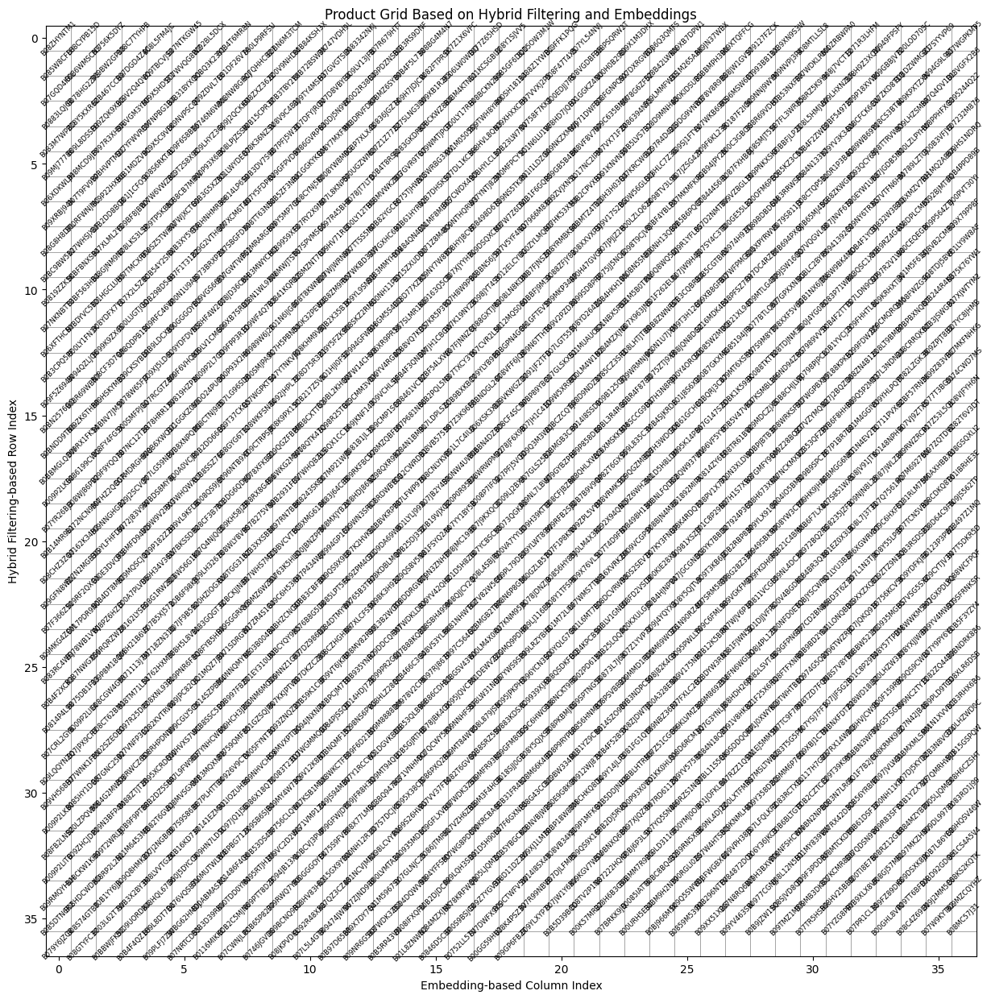

In [8]:
import matplotlib.pyplot as plt

# Plotting function with adjusted font size and rotation
def plot_product_grid(grid):
    plt.figure(figsize=(15, 15))
    plt.imshow(np.full((grid_size, grid_size), np.nan), cmap='viridis', interpolation='none')  # Empty grid
    plt.title('Product Grid Based on Hybrid Filtering and Embeddings')

    for i in range(grid_size):
        plt.axhline(i - 0.5, color='gray', linewidth=0.5)
        plt.axvline(i - 0.5, color='gray', linewidth=0.5)

    for (row, col), product_id in np.ndenumerate(grid):
        if product_id is not None:
            plt.text(col, row, product_id, ha='center', va='center', fontsize=6, rotation=45)

    plt.xlabel('Embedding-based Column Index')
    plt.ylabel('Hybrid Filtering-based Row Index')
    plt.grid(False)
    plt.show()

plot_product_grid(grid)


In [9]:
pip install plotly


In [4]:
import json
import csv

# Define the CSV file header
header = ['item_id','item_keywords', 'item_name', 'model_name', 'product_description', 'product_type']

# Open the CSV file for writing
with open('output.csv', 'w', encoding='utf-8', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(header)
    
    # Read and process the JSON data line by line
    with open('listings_0.json', 'r', encoding='utf-8') as f:
        for line in f:
            item = json.loads(line)
            row = []
            for key in header:
                if key in item:
                    # Handle lists of dictionaries by joining their 'value' fields
                    if isinstance(item[key], list):
                        values = [entry['value'] for entry in item[key] if 'value' in entry]
                        row.append(', '.join(values))
                    else:
                        row.append(item[key])
                else:
                    row.append('')
            csvwriter.writerow(row)

print("Data has been written to output.csv")


Data has been written to output.csv


In [5]:
import json
import csv

# Define the CSV file header
header = ['item_id', 'item_keywords', 'item_name', 'model_name', 'product_description', 'product_type']

# Open the CSV file for writing
with open('output.csv', 'w', encoding='utf-8', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(header)
    
    # Read and process the JSON data line by line
    with open('listings_0.json', 'r', encoding='utf-8') as f:
        for line in f:
            item = json.loads(line)
            row = []
            for key in header:
                if key in item:
                    # Handle lists of dictionaries by joining their 'value' fields
                    if isinstance(item[key], list):
                        values = [entry['value'] for entry in item[key] if 'value' in entry]
                        row.append(', '.join(values))
                    else:
                        row.append(item[key])
                else:
                    row.append('')
            # Ensure that no data is truncated by writing the row as is
            csvwriter.writerow(row)

print("Data has been written to output.csv")


Data has been written to output.csv


In [7]:
# ##############################################################################################

import csv
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
import random
import matplotlib.patches as mpatches
from heapq import heappush, heappop

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)
csv_file = "amazon.csv"

# Read the CSV data and create a dictionary of products
products_dict = {}
with open(csv_file, mode='r', encoding='utf-8') as file:
    csv_reader = csv.DictReader(file)
    for row in csv_reader:
        # Extract and clean the rating_count
        try:
            rating_count = int(row['rating_count'].replace(',', '')) if row['rating_count'] else 0
        except ValueError:
            rating_count = 0

        # Extract and clean the rating
        try:
            rating = float(row['rating'])
        except ValueError:
            rating = 0.0

        # Create a dictionary for each product
        product_details = {
            'product_id': row['product_id'],
            'product_name': row['product_name'],
            'category': row['category'],
            'rating': rating,
            'rating_count': rating_count,
            'about_product': row['about_product']
        }
        # Use product_id as the key for the products dictionary
        products_dict[row['product_id']] = product_details

# Print available product IDs
print("Available product IDs:", list(products_dict.keys())[:10])  # Print first 10 product IDs for checking

# Construct the grid
num_products = len(products_dict)
grid_size = int(np.ceil(np.sqrt(num_products)))
grid = np.empty((grid_size, grid_size), dtype=object)

# Calculate row indices using hybrid filtering
categories = np.array([p['category'] for p in products_dict.values()]).reshape(-1, 1)
category_encoded = encoder.fit_transform(categories)

features = np.array([[p['rating'], p['rating_count']] for p in products_dict.values()])
features = np.concatenate((category_encoded, features), axis=1)

scaler = MinMaxScaler()
row_indices = scaler.fit_transform(features)

# Calculate column indices using Word2Vec embeddings for better semantic similarity
corpus = [p['about_product'].split() for p in products_dict.values()]
word2vec_model = Word2Vec(sentences=corpus, vector_size=50, window=5, min_count=1, workers=4)
product_vectors = np.array([np.mean([word2vec_model.wv[word] for word in words if word in word2vec_model.wv]
                                    or [np.zeros(50)], axis=0) for words in corpus])

column_indices = scaler.fit_transform(product_vectors)

# Normalize indices to fit within grid size
row_indices = (row_indices[:, 0] * (grid_size - 1)).astype(int)
column_indices = (column_indices[:, 0] * (grid_size - 1)).astype(int)

# Shuffle the product IDs to ensure a random distribution
product_ids = list(products_dict.keys())
random.shuffle(product_ids)

# Place products in the grid based on normalized indices
for idx, product_id in enumerate(product_ids):
    row = row_indices[idx]
    col = column_indices[idx]
    while grid[row, col] is not None:
        col = (col + 1) % grid_size
        if col == 0:
            row = (row + 1) % grid_size
    grid[row, col] = product_id
    print(f"Product ID: {product_id}, Row: {row}, Column: {col}")



Available product IDs: ['B07JW9H4J1', 'B098NS6PVG', 'B096MSW6CT', 'B08HDJ86NZ', 'B08CF3B7N1', 'B08Y1TFSP6', 'B08WRWPM22', 'B08DDRGWTJ', 'B008IFXQFU', 'B082LZGK39']


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Product ID: B00VA7YYUO, Row: 0, Column: 12
Product ID: B081B1JL35, Row: 0, Column: 13
Product ID: B09NHVCHS9, Row: 0, Column: 11
Product ID: B08ZXZ362Z, Row: 0, Column: 7
Product ID: B07WGPBXY9, Row: 0, Column: 5
Product ID: B00OFM6PEO, Row: 0, Column: 8
Product ID: B09H3BXWTK, Row: 0, Column: 19
Product ID: B086GVRP63, Row: 0, Column: 3
Product ID: B09ZTZ9N3Q, Row: 0, Column: 14
Product ID: B09NS5TKPN, Row: 0, Column: 9
Product ID: B07WMS7TWB, Row: 0, Column: 4
Product ID: B08235JZFB, Row: 0, Column: 10
Product ID: B0762HXMTF, Row: 0, Column: 15
Product ID: B09P182Z2H, Row: 0, Column: 16
Product ID: B07PFJ5VQD, Row: 0, Column: 6
Product ID: B00LOD70SC, Row: 0, Column: 22
Product ID: B08WKCTFF3, Row: 0, Column: 17
Product ID: B00AXHBBXU, Row: 0, Column: 18
Product ID: B003L62T7W, Row: 0, Column: 20
Product ID: B09LHYZ3GJ, Row: 0, Column: 21
Product ID: B07L8KNP5F, Row: 0, Column: 23
Product ID: B077BTLQ67, Row: 0, Column: 24
Product ID: B0BLV1GNLN, Row: 0, Column: 25
Product ID: B0B9RZ

Recommended products: ['B00P93X0VO', 'B08L12N5H1', 'B0BNLFQDG2', 'B08HV83HL3', 'B0B4SJKRDF', 'B09GFLXVH9', 'B005FYNT3G', 'B09GFM8CGS', 'B09GFPN6TP', 'B09GFPVD9Y']


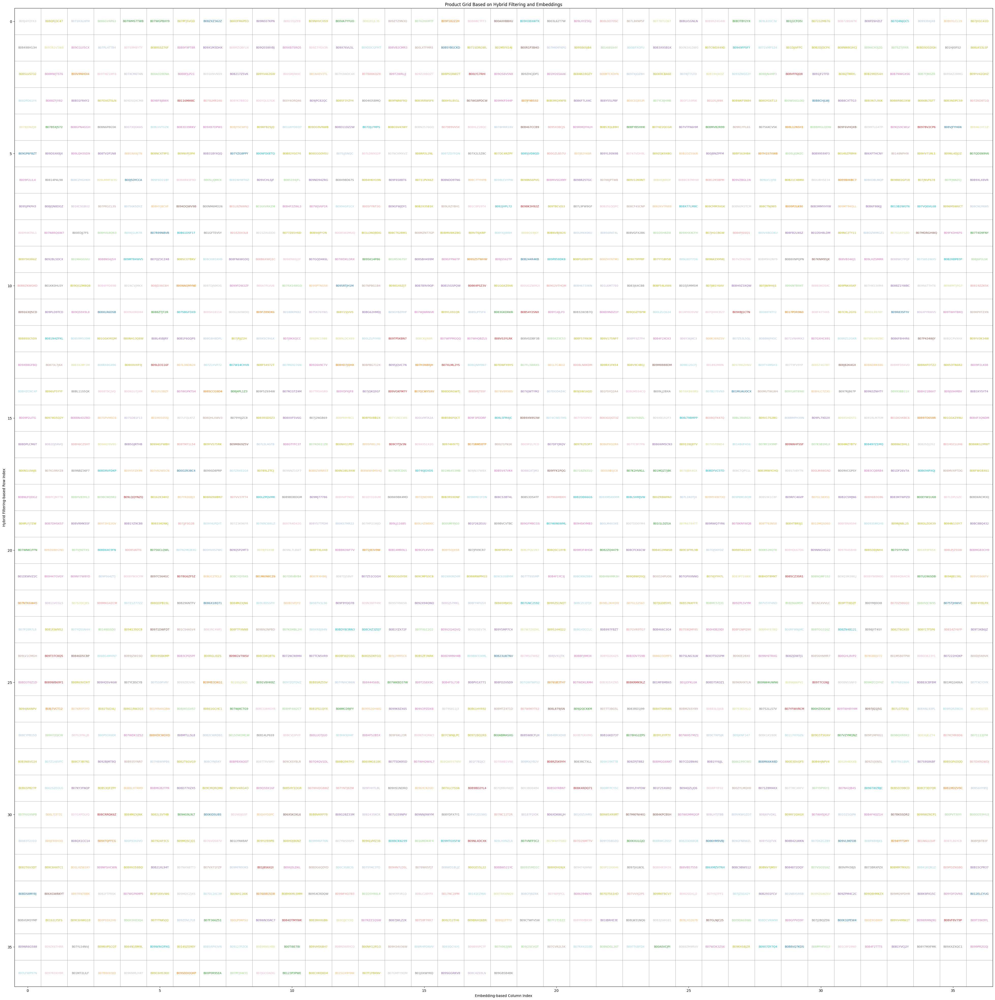

In [8]:
# A* search functions
def calculate_similarity(product1, product2):
    vectorizer = TfidfVectorizer()
    text_vectors = vectorizer.fit_transform([product1['about_product'], product2['about_product']])
    cosine_sim = cosine_similarity(text_vectors[0:1], text_vectors[1:2])[0][0]
    rating_similarity = min(product1['rating'], product2['rating']) / max(product1['rating'], product2['rating'])
    rating_count_similarity = min(product1['rating_count'], product2['rating_count']) / max(product1['rating_count'], product2['rating_count'])
    similarity_score = cosine_sim + rating_similarity + rating_count_similarity
    return similarity_score

def a_star_search_recommendations(start, grid, products_dict, max_recommendations=10):
    def heuristic(product1, product2):
        return calculate_similarity(products_dict[product1], products_dict[product2])

    open_set = []
    heappush(open_set, (0, start))
    came_from = {}
    g_score = {product: float('inf') for row in grid for product in row if product}
    g_score[start] = 0
    f_score = {product: float('inf') for row in grid for product in row if product}
    f_score[start] = 0

    recommendations = []
    while open_set and len(recommendations) < max_recommendations:
        _, current = heappop(open_set)
        if current not in recommendations:
            recommendations.append(current)
        for row in grid:
            for neighbor in row:
                if neighbor and neighbor != current:
                    tentative_g_score = g_score[current] + calculate_similarity(products_dict[current], products_dict[neighbor])
                    if tentative_g_score < g_score[neighbor]:
                        came_from[neighbor] = current
                        g_score[neighbor] = tentative_g_score
                        f_score[neighbor] = g_score[neighbor] + heuristic(neighbor, current)
                        heappush(open_set, (f_score[neighbor], neighbor))


    return recommendations

# Choose a valid start product ID from the printed list
start_product_id = "B00P93X0VO"  # Use the first available product ID
recommendations = a_star_search_recommendations(start_product_id, grid, products_dict, max_recommendations=10)
print("Recommended products:", recommendations)

# Visualization with improved clarity
plt.figure(figsize=(50, 50))
plt.imshow(np.full((grid_size, grid_size), np.nan), cmap='viridis', interpolation='none')  # Empty grid
plt.title('Product Grid Based on Hybrid Filtering and Embeddings')

# Define colors for categories
categories_unique = list(set(p['category'] for p in products_dict.values()))
category_colors = {category: plt.cm.tab20(i / len(categories_unique)) for i, category in enumerate(categories_unique)}

for i in range(grid_size):
    plt.axhline(i - 0.5, color='gray', linewidth=0.5)
    plt.axvline(i - 0.5, color='gray', linewidth=0.5)

for (row, col), product_id in np.ndenumerate(grid):
    if product_id is not None:
        category = products_dict[product_id]['category']
        color = category_colors[category]
        plt.text(col, row, product_id, ha='center', va='center', fontsize=8, color=color)

# Create legend
# legend_patches = [mpatches.Patch(color=color, label=category) for category, color in category_colors.items()]
# plt.legend(handles=legend_patches, loc='upper left', bbox_to_anchor=(1, 1))

plt.xlabel('Embedding-based Column Index')
plt.ylabel('Hybrid Filtering-based Row Index')
plt.grid(False)
plt.show()

Available product IDs: ['B07JW9H4J1', 'B098NS6PVG', 'B096MSW6CT', 'B08HDJ86NZ', 'B08CF3B7N1', 'B08Y1TFSP6', 'B08WRWPM22', 'B08DDRGWTJ', 'B008IFXQFU', 'B082LZGK39']


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Product ID: B01L8ZNWN2, Row: 0, Column: 12
Product ID: B07Q7561HD, Row: 0, Column: 13
Product ID: B09M3F4HGB, Row: 0, Column: 11
Product ID: B095JPKPH3, Row: 0, Column: 7
Product ID: B0B1F6GQPS, Row: 0, Column: 5
Product ID: B00J4YG0PC, Row: 0, Column: 8
Product ID: B09H3BXWTK, Row: 0, Column: 19
Product ID: B07YR26BJ3, Row: 0, Column: 2
Product ID: B0B2RBP83P, Row: 0, Column: 14
Product ID: B0B54Y2SNX, Row: 0, Column: 9
Product ID: B08YDFX7Y1, Row: 0, Column: 3
Product ID: B07DJLFMPS, Row: 0, Column: 10
Product ID: B08QHLXWV3, Row: 0, Column: 15
Product ID: B09163Q5CD, Row: 0, Column: 16
Product ID: B00B7GKXMG, Row: 0, Column: 6
Product ID: B00LP9RFSU, Row: 0, Column: 22
Product ID: B08CZHGHKH, Row: 0, Column: 17
Product ID: B098QXR9X2, Row: 0, Column: 18
Product ID: B00OFM6PEO, Row: 0, Column: 20
Product ID: B08XXF5V6G, Row: 0, Column: 21
Product ID: B009VCGPSY, Row: 0, Column: 23
Product ID: B07DC4RZPY, Row: 0, Column: 24
Product ID: B0814LP6S9, Row: 0, Column: 25
Product ID: B0BMXM

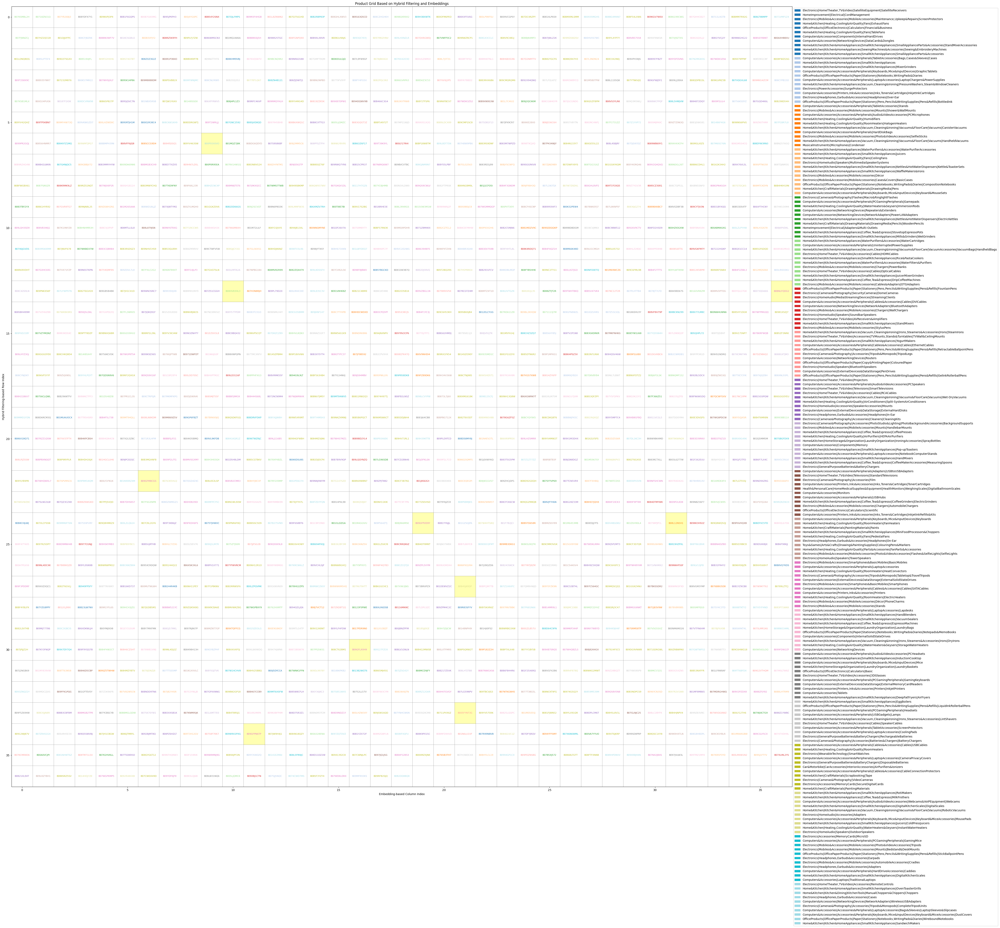

In [9]:
import csv
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
import random
import matplotlib.patches as mpatches
from heapq import heappush, heappop

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)
csv_file = "amazon.csv"

# Read the CSV data and create a dictionary of products
products_dict = {}
with open(csv_file, mode='r', encoding='utf-8') as file:
    csv_reader = csv.DictReader(file)
    for row in csv_reader:
        # Extract and clean the rating_count
        try:
            rating_count = int(row['rating_count'].replace(',', '')) if row['rating_count'] else 0
        except ValueError:
            rating_count = 0

        # Extract and clean the rating
        try:
            rating = float(row['rating'])
        except ValueError:
            rating = 0.0

        # Create a dictionary for each product
        product_details = {
            'product_id': row['product_id'],
            'product_name': row['product_name'],
            'category': row['category'],
            'rating': rating,
            'rating_count': rating_count,
            'about_product': row['about_product']
        }
        # Use product_id as the key for the products dictionary
        products_dict[row['product_id']] = product_details

# Print available product IDs
print("Available product IDs:", list(products_dict.keys())[:10])  # Print first 10 product IDs for checking

# Construct the grid
num_products = len(products_dict)
grid_size = int(np.ceil(np.sqrt(num_products)))
grid = np.empty((grid_size, grid_size), dtype=object)

# Calculate row indices using hybrid filtering
categories = np.array([p['category'] for p in products_dict.values()]).reshape(-1, 1)
category_encoded = encoder.fit_transform(categories)

features = np.array([[p['rating'], p['rating_count']] for p in products_dict.values()])
features = np.concatenate((category_encoded, features), axis=1)

scaler = MinMaxScaler()
row_indices = scaler.fit_transform(features)

# Calculate column indices using Word2Vec embeddings for better semantic similarity
corpus = [p['about_product'].split() for p in products_dict.values()]
word2vec_model = Word2Vec(sentences=corpus, vector_size=50, window=5, min_count=1, workers=4)
product_vectors = np.array([np.mean([word2vec_model.wv[word] for word in words if word in word2vec_model.wv]
                                    or [np.zeros(50)], axis=0) for words in corpus])

column_indices = scaler.fit_transform(product_vectors)

# Normalize indices to fit within grid size
row_indices = (row_indices[:, 0] * (grid_size - 1)).astype(int)
column_indices = (column_indices[:, 0] * (grid_size - 1)).astype(int)

# Shuffle the product IDs to ensure a random distribution
product_ids = list(products_dict.keys())
random.shuffle(product_ids)

# Place products in the grid based on normalized indices
for idx, product_id in enumerate(product_ids):
    row = row_indices[idx]
    col = column_indices[idx]
    while grid[row, col] is not None:
        col = (col + 1) % grid_size
        if col == 0:
            row = (row + 1) % grid_size
    grid[row, col] = product_id
    print(f"Product ID: {product_id}, Row: {row}, Column: {col}")

# A* search functions
def calculate_similarity(product1, product2):
    vectorizer = TfidfVectorizer()
    text_vectors = vectorizer.fit_transform([product1['about_product'], product2['about_product']])
    cosine_sim = cosine_similarity(text_vectors[0:1], text_vectors[1:2])[0][0]
    rating_similarity = min(product1['rating'], product2['rating']) / max(product1['rating'], product2['rating'])
    rating_count_similarity = min(product1['rating_count'], product2['rating_count']) / max(product1['rating_count'], product2['rating_count'])
    similarity_score = cosine_sim + rating_similarity + rating_count_similarity
    return similarity_score

def a_star_search_recommendations(start, grid, products_dict, max_recommendations=10):
    def heuristic(product1, product2):
        # Grid distance
        loc1 = np.argwhere(grid == product1)[0]
        loc2 = np.argwhere(grid == product2)[0]
        grid_distance = np.sum(np.abs(loc1 - loc2))
        return calculate_similarity(products_dict[product1], products_dict[product2]) / (1 + grid_distance)

    open_set = []
    heappush(open_set, (0, start))
    came_from = {}
    g_score = {product: float('inf') for row in grid for product in row if product}
    g_score[start] = 0
    f_score = {product: float('inf') for row in grid for product in row if product}
    f_score[start] = 0

    recommendations = []
    traversed_grids = []

    while open_set and len(recommendations) < max_recommendations:
        _, current = heappop(open_set)
        if current not in recommendations:
            recommendations.append(current)
        traversed_grids.append(np.argwhere(grid == current)[0])
        for row in grid:
            for neighbor in row:
                if neighbor and neighbor != current:
                    tentative_g_score = g_score[current] + calculate_similarity(products_dict[current], products_dict[neighbor])
                    if tentative_g_score < g_score[neighbor]:
                        came_from[neighbor] = current
                        g_score[neighbor] = tentative_g_score
                        f_score[neighbor] = g_score[neighbor] + heuristic(neighbor, current)
                        heappush(open_set, (f_score[neighbor], neighbor))

    return recommendations, traversed_grids

# Choose a valid start product ID from the printed list
start_product_id = "B00P93X0VO"  # Use the first available product ID
recommendations, traversed_grids = a_star_search_recommendations(start_product_id, grid, products_dict, max_recommendations=10)
print("Recommended products:", recommendations)

# Visualization with improved clarity
plt.figure(figsize=(50, 50))
plt.imshow(np.full((grid_size, grid_size), np.nan), cmap='viridis', interpolation='none')  # Empty grid
plt.title('Product Grid Based on Hybrid Filtering and Embeddings')

# Define colors for categories
categories_unique = list(set(p['category'] for p in products_dict.values()))
category_colors = {category: plt.cm.tab20(i / len(categories_unique)) for i, category in enumerate(categories_unique)}

for i in range(grid_size):
    plt.axhline(i - 0.5, color='gray', linewidth=0.5)
    plt.axvline(i - 0.5, color='gray', linewidth=0.5)

# Highlight traversed grids
for loc in traversed_grids:
    plt.gca().add_patch(plt.Rectangle((loc[1]-0.5, loc[0]-0.5), 1, 1, fill=True, color='yellow', alpha=0.3))

for (row, col), product_id in np.ndenumerate(grid):
    if product_id is not None:
        category = products_dict[product_id]['category']
        color = category_colors[category]
        plt.text(col, row, product_id, ha='center', va='center', fontsize=8, color=color)

# Create legend
legend_patches = [mpatches.Patch(color=color, label=category) for category, color in category_colors.items()]
plt.legend(handles=legend_patches, loc='upper left', bbox_to_anchor=(1, 1))

plt.xlabel('Embedding-based Column Index')
plt.ylabel('Hybrid Filtering-based Row Index')
plt.grid(False)
plt.show()


In [21]:
import csv
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
import random
import matplotlib.patches as mpatches
from heapq import heappush, heappop

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)
csv_file = "updated_combined_data.csv"

# Read the CSV data and create a dictionary of products
products_dict = {}
with open(csv_file, mode='r', encoding='utf-8') as file:
    csv_reader = csv.DictReader(file)
    for row in csv_reader:
        # Extract and clean the rating
        try:
            rating = float(row['average_rating'])
        except ValueError:
            rating = 0.0

        # Create a dictionary for each product
        product_details = {
            'product_id': row['parent_asin'],
            'product_name': row['title'],
            'category': row['\ufeff"main_category"'],
            'rating': rating,
            'about_product': row['description']
        }
        # Use product_id as the key for the products dictionary
        products_dict[row['parent_asin']] = product_details

# Print available product IDs
print("Available product IDs:", list(products_dict.keys())[:10])  # Print first 10 product IDs for checking

# Construct the grid
num_products = len(products_dict)
grid_size = int(np.ceil(np.sqrt(num_products)))
grid = np.empty((grid_size, grid_size), dtype=object)

# Calculate row indices using hybrid filtering
categories = np.array([p['category'] for p in products_dict.values()]).reshape(-1, 1)
category_encoded = encoder.fit_transform(categories)

features = np.array([[p['rating']] for p in products_dict.values()])
features = np.concatenate((category_encoded, features), axis=1)

scaler = MinMaxScaler()
row_indices = scaler.fit_transform(features)

# Calculate column indices using Word2Vec embeddings for better semantic similarity
corpus = [p['about_product'].split() for p in products_dict.values()]
word2vec_model = Word2Vec(sentences=corpus, vector_size=50, window=5, min_count=1, workers=4)
product_vectors = np.array([np.mean([word2vec_model.wv[word] for word in words if word in word2vec_model.wv]
                                    or [np.zeros(50)], axis=0) for words in corpus])

column_indices = scaler.fit_transform(product_vectors)

# Normalize indices to fit within grid size
row_indices = (row_indices[:, 0] * (grid_size - 1)).astype(int)
column_indices = (column_indices[:, 0] * (grid_size - 1)).astype(int)

# Shuffle the product IDs to ensure a random distribution
product_ids = list(products_dict.keys())
random.shuffle(product_ids)

# Place products in the grid based on normalized indices
for idx, product_id in enumerate(product_ids):
    row = row_indices[idx]
    col = column_indices[idx]
    while grid[row, col] is not None:
        col = (col + 1) % grid_size
        if col == 0:
            row = (row + 1) % grid_size
    grid[row, col] = product_id

# A* search functions
def calculate_similarity(product1, product2):
    vectorizer = TfidfVectorizer()
    text_vectors = vectorizer.fit_transform([product1['about_product'], product2['about_product']])
    cosine_sim = cosine_similarity(text_vectors[0:1], text_vectors[1:2])[0][0]
    rating_similarity = min(product1['rating'], product2['rating']) / max(product1['rating'], product2['rating'])
    similarity_score = cosine_sim + rating_similarity
    return similarity_score

def a_star_search_recommendations(start, grid, products_dict, max_recommendations=10):
    def heuristic(product1, product2):
        # Grid distance
        loc1 = np.argwhere(grid == product1)[0]
        loc2 = np.argwhere(grid == product2)[0]
        grid_distance = np.sum(np.abs(loc1 - loc2))
        similarity_score = calculate_similarity(products_dict[product1], products_dict[product2])
        return grid_distance - similarity_score

    open_set = []
    heappush(open_set, (0, start))
    came_from = {}
    g_score = {product: float('inf') for row in grid for product in row if product}
    g_score[start] = 0
    f_score = {product: float('inf') for row in grid for product in row if product}
    f_score[start] = 0

    recommendations = []
    traversed_grids = []

    while open_set and len(recommendations) < max_recommendations:
        _, current = heappop(open_set)
        if current not in recommendations:
            recommendations.append(current)
        traversed_grids.append(np.argwhere(grid == current)[0])
        for row in grid:
            for neighbor in row:
                if neighbor and neighbor != current:
                    tentative_g_score = g_score[current] + heuristic(current, neighbor)
                    if tentative_g_score < g_score[neighbor]:
                        came_from[neighbor] = current
                        g_score[neighbor] = tentative_g_score
                        f_score[neighbor] = g_score[neighbor] + heuristic(neighbor, current)
                        heappush(open_set, (f_score[neighbor], neighbor))

    return recommendations, traversed_grids

# Choose a valid start product ID from the printed list
start_product_id = "B001DPQASW"  # Use the first available product ID
recommendations, traversed_grids = a_star_search_recommendations(start_product_id, grid, products_dict, max_recommendations=10)
print("Recommended products:", recommendations)

# Visualization with improved clarity
plt.figure(figsize=(50, 50))
plt.imshow(np.full((grid_size, grid_size), np.nan), cmap='viridis', interpolation='none')  # Empty grid
plt.title('Product Grid Based on Hybrid Filtering and Embeddings')

# Highlight traversed grids
for loc in traversed_grids:
    plt.gca().add_patch(plt.Rectangle((loc[1]-0.5, loc[0]-0.5), 1, 1, fill=True, color='yellow', alpha=0.3))

for (row, col), product_id in np.ndenumerate(grid):
    if product_id is not None:
        plt.text(col, row, product_id, ha='center', va='center', fontsize=8)

plt.xlabel('Column Index')
plt.ylabel('Row Index')
plt.grid(False)
plt.show()


Available product IDs: ['B08Z743RRD', 'B097BQDGHJ', 'B00IN9AGAE', 'B0C7K98JZS', 'B07QZHQTVJ', 'B00GS4892I', 'B07W42P978', 'B078ZF9JS1', 'B083Q6Y54F', 'B00KAS9ZMG']


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


ValueError: empty vocabulary; perhaps the documents only contain stop words

In [12]:
import csv
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
import random
import matplotlib.patches as mpatches
from heapq import heappush, heappop

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)
csv_file = "amazon.csv"

# Read the CSV data and create a dictionary of products
products_dict = {}
with open(csv_file, mode='r', encoding='utf-8') as file:
    csv_reader = csv.DictReader(file)
    for row in csv_reader:
        # Extract and clean the rating_count
        try:
            rating_count = int(row['rating_count'].replace(',', '')) if row['rating_count'] else 0
        except ValueError:
            rating_count = 0

        # Extract and clean the rating
        try:
            rating = float(row['rating'])
        except ValueError:
            rating = 0.0

        # Create a dictionary for each product
        product_details = {
            'product_id': row['product_id'],
            'product_name': row['product_name'],
            'category': row['category'],
            'rating': rating,
            'rating_count': rating_count,
            'about_product': row['about_product']
        }
        # Use product_id as the key for the products dictionary
        products_dict[row['product_id']] = product_details

# Print available product IDs
print("Available product IDs:", list(products_dict.keys())[:10])  # Print first 10 product IDs for checking

# Construct the grid
num_products = len(products_dict)
grid_size = int(np.ceil(np.sqrt(num_products)))
grid = np.empty((grid_size, grid_size), dtype=object)

# Calculate features for clustering
categories = np.array([p['category'] for p in products_dict.values()]).reshape(-1, 1)
category_encoded = encoder.fit_transform(categories)

features = np.array([[p['rating'], p['rating_count']] for p in products_dict.values()])
features = np.concatenate((category_encoded, features), axis=1)

corpus = [p['about_product'].split() for p in products_dict.values()]
word2vec_model = Word2Vec(sentences=corpus, vector_size=50, window=5, min_count=1, workers=4)
product_vectors = np.array([np.mean([word2vec_model.wv[word] for word in words if word in word2vec_model.wv]
                                    or [np.zeros(50)], axis=0) for words in corpus])

combined_features = np.concatenate((features, product_vectors), axis=1)

# Apply K-means clustering
kmeans = KMeans(n_clusters=grid_size, random_state=0).fit(combined_features)
labels = kmeans.labels_

# Organize products by clusters and sort within clusters by a combination of their features
sorted_products = [[] for _ in range(grid_size)]
for idx, label in enumerate(labels):
    sorted_products[label].append(products_dict[list(products_dict.keys())[idx]])

for cluster in sorted_products:
    cluster.sort(key=lambda x: (x['rating'], x['rating_count']), reverse=True)

# Place products in the grid based on cluster assignments and sorting within clusters
product_index = 0
for i in range(grid_size):
    for j in range(grid_size):
        if product_index < num_products:
            grid[i, j] = sorted_products[labels[product_index]].pop(0)['product_id']
            product_index += 1

# A* search functions
def calculate_similarity(product1, product2):
    vectorizer = TfidfVectorizer()
    text_vectors = vectorizer.fit_transform([product1['about_product'], product2['about_product']])
    cosine_sim = cosine_similarity(text_vectors[0:1], text_vectors[1:2])[0][0]
    rating_similarity = min(product1['rating'], product2['rating']) / max(product1['rating'], product2['rating'])
    rating_count_similarity = min(product1['rating_count'], product2['rating_count']) / max(product1['rating_count'], product2['rating_count'])
    similarity_score = cosine_sim + rating_similarity + rating_count_similarity
    return similarity_score

def a_star_search_recommendations(start, grid, products_dict, max_recommendations=10):
    def heuristic(product1, product2):
        # Grid distance
        loc1 = np.argwhere(grid == product1)[0]
        loc2 = np.argwhere(grid == product2)[0]
        grid_distance = np.sum(np.abs(loc1 - loc2))
        similarity_score = calculate_similarity(products_dict[product1], products_dict[product2])
        return grid_distance - similarity_score

    open_set = []
    heappush(open_set, (0, start))
    came_from = {}
    g_score = {product: float('inf') for row in grid for product in row if product}
    g_score[start] = 0
    f_score = {product: float('inf') for row in grid for product in row if product}
    f_score[start] = 0

    recommendations = []
    traversed_grids = []

    while open_set and len(recommendations) < max_recommendations:
        _, current = heappop(open_set)
        if current not in recommendations:
            recommendations.append(current)
        traversed_grids.append(np.argwhere(grid == current)[0])
        for row in grid:
            for neighbor in row:
                if neighbor and neighbor != current:
                    tentative_g_score = g_score[current] + heuristic(current, neighbor)
                    if tentative_g_score < g_score[neighbor]:
                        came_from[neighbor] = current
                        g_score[neighbor] = tentative_g_score
                        f_score[neighbor] = g_score[neighbor] + heuristic(neighbor, current)
                        heappush(open_set, (f_score[neighbor], neighbor))

    return recommendations, traversed_grids

# Choose a valid start product ID from the printed list
start_product_id = "B00P93X0VO"  # Use the first available product ID
recommendations, traversed_grids = a_star_search_recommendations(start_product_id, grid, products_dict, max_recommendations=10)

# Print recommended products with titles and categories
print("Recommended products:")
for rec in recommendations:
    product = products_dict[rec]
    print(f"Product ID: {rec}, Title: {product['product_name']}, Category: {product['category']}")

# Visualization with improved clarity
plt.figure(figsize=(50, 50))
plt.imshow(np.full((grid_size, grid_size), np.nan), cmap='viridis', interpolation='none')  # Empty grid
plt.title('Product Grid Based on Hybrid Filtering and Embeddings')

# Define colors for categories
categories_unique = list(set(p['category'] for p in products_dict.values()))
category_colors = {category: plt.cm.tab20(i / len(categories_unique)) for i, category in enumerate(categories_unique)}

for i in range(grid_size):
    plt.axhline(i - 0.5, color='gray', linewidth=0.5)
    plt.axvline(i - 0.5, color='gray', linewidth=0.5)

# Highlight traversed grids
for loc in traversed_grids:
    plt.gca().add_patch(plt.Rectangle((loc[1]-0.5, loc[0]-0.5), 1, 1, fill=True, color='yellow', alpha=0.3))

for (row, col), product_id in np.ndenumerate(grid):
    if product_id is not None:
        category = products_dict[product_id]['category']
        color = category_colors[category]
        plt.text(col, row, product_id, ha='center', va='center', fontsize=8, color=color)

# Create legend
legend_patches = [mpatches.Patch(color=color, label=category) for category, color in category_colors.items()]
plt.legend(handles=legend_patches, loc='upper left', bbox_to_anchor=(1, 1))

plt.xlabel('Embedding-based Column Index')
plt.ylabel('Hybrid Filtering-based Row Index')
plt.grid(False)
plt.show()


Available product IDs: ['B07JW9H4J1', 'B098NS6PVG', 'B096MSW6CT', 'B08HDJ86NZ', 'B08CF3B7N1', 'B08Y1TFSP6', 'B08WRWPM22', 'B08DDRGWTJ', 'B008IFXQFU', 'B082LZGK39']


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KeyboardInterrupt: 

In [18]:
import csv

# Specify the CSV file path
csv_file = "updated_combined_data.csv"

# Read the first row of the CSV file to get the column names
with open(csv_file, mode='r', encoding='utf-8') as file:
    csv_reader = csv.reader(file)
    # Get the first row
    first_row = next(csv_reader)
    # Print the column names
    print("Column Names:", first_row)


Column Names: ['\ufeff"main_category"', 'title', 'average_rating', 'description', 'parent_asin', 'bought_together']


In [3]:
import csv
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import OneHotEncoder
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
import matplotlib.patches as mpatches
from heapq import heappush, heappop
from sklearn.metrics.pairwise import cosine_similarity


# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)
csv_file = "updated_combined_data.csv"

# Read the CSV data and create a dictionary of products
products_dict = {}
with open(csv_file, mode='r', encoding='utf-8') as file:
    csv_reader = csv.DictReader(file)
    for row in csv_reader:
        # Extract and clean the rating
        try:
            rating = float(row['average_rating'])
        except ValueError:
            rating = 0.0

        # Create a dictionary for each product
        product_details = {
            'product_id': row['parent_asin'],
            'product_name': row['title'],
            'category': row['\ufeff"main_category"'],
            'rating': rating,
            'about_product': row['description']
        }
        # Use parent_asin as the key for the products dictionary
        products_dict[row['parent_asin']] = product_details

# Print available product IDs
print("Available product IDs:", list(products_dict.keys())[:10])  # Print first 10 product IDs for checking

# Construct the grid
num_products = len(products_dict)
grid_size = int(np.ceil(np.sqrt(num_products)))
grid = np.empty((grid_size, grid_size), dtype=object)

# Calculate features for clustering
categories = np.array([p['category'] for p in products_dict.values()]).reshape(-1, 1)
category_encoded = encoder.fit_transform(categories)

features = np.array([[p['rating']] for p in products_dict.values()])
features = np.concatenate((category_encoded, features), axis=1)

corpus = [p['about_product'].split() for p in products_dict.values()]
word2vec_model = Word2Vec(sentences=corpus, vector_size=50, window=5, min_count=1, workers=4)
product_vectors = np.array([np.mean([word2vec_model.wv[word] for word in words if word in word2vec_model.wv]
                                    or [np.zeros(50)], axis=0) for words in corpus])

combined_features = np.concatenate((features, product_vectors), axis=1)

# Apply K-means clustering
kmeans = KMeans(n_clusters=grid_size, random_state=0).fit(combined_features)
labels = kmeans.labels_

# Organize products by clusters and sort within clusters by a combination of their features
sorted_products = [[] for _ in range(grid_size)]
for idx, label in enumerate(labels):
    sorted_products[label].append(products_dict[list(products_dict.keys())[idx]])

for cluster in sorted_products:
    cluster.sort(key=lambda x: x['rating'], reverse=True)

# Place products in the grid based on cluster assignments and sorting within clusters
product_index = 0
for i in range(grid_size):
    for j in range(grid_size):
        if product_index < num_products:
            grid[i, j] = sorted_products[labels[product_index]].pop(0)['product_id']
            product_index += 1

# A* search functions
def calculate_similarity(product1, product2):
    # Check if both products have non-empty descriptions
    if not product1['about_product'] or not product2['about_product']:
        return 0.0
    
    vectorizer = TfidfVectorizer()
    text_vectors = vectorizer.fit_transform([product1['about_product'], product2['about_product']])
    cosine_sim = cosine_similarity(text_vectors[0:1], text_vectors[1:2])[0][0]
    rating_similarity = min(product1['rating'], product2['rating']) / max(product1['rating'], product2['rating'])
    similarity_score = cosine_sim + rating_similarity
    return similarity_score


def a_star_search_recommendations(start, grid, products_dict, max_recommendations=10):
    def heuristic(product1, product2):
        # Grid distance
        loc1 = np.argwhere(grid == product1)[0]
        loc2 = np.argwhere(grid == product2)[0]
        grid_distance = np.sum(np.abs(loc1 - loc2))
        similarity_score = calculate_similarity(products_dict[product1], products_dict[product2])
        return grid_distance - similarity_score

    open_set = []
    heappush(open_set, (0, start))
    came_from = {}
    g_score = {product: float('inf') for row in grid for product in row if product}
    g_score[start] = 0
    f_score = {product: float('inf') for row in grid for product in row if product}
    f_score[start] = 0

    recommendations = []
    traversed_grids = []

    while open_set and len(recommendations) < max_recommendations:
        _, current = heappop(open_set)
        if current not in recommendations:
            recommendations.append(current)
        traversed_grids.append(np.argwhere(grid == current)[0])
        for row in grid:
            for neighbor in row:
                if neighbor and neighbor != current:
                    tentative_g_score = g_score[current] + heuristic(current, neighbor)
                    if tentative_g_score < g_score[neighbor]:
                        came_from[neighbor] = current
                        g_score[neighbor] = tentative_g_score
                        f_score[neighbor] = g_score[neighbor] + heuristic(neighbor, current)
                        heappush(open_set, (f_score[neighbor], neighbor))

    return recommendations, traversed_grids

# Choose a valid start product ID from the printed list
start_product_id = "B001DPQASW"  # Use the first available product ID
recommendations, traversed_grids = a_star_search_recommendations(start_product_id, grid, products_dict, max_recommendations=10)

# Print recommended products with titles and categories
print("Recommended products:")
for rec in recommendations:
    product = products_dict[rec]
    print(f"Product ID: {rec}, Title: {product['product_name']}, Category: {product['category']}")

# Visualization with improved clarity
plt.figure(figsize=(50, 50))
plt.imshow(np.full((grid_size, grid_size), np.nan), cmap='viridis', interpolation='none')  # Empty grid
plt.title('Product Grid Based on Hybrid Filtering and Embeddings')

# Define colors for categories
categories_unique = list(set(p['category'] for p in products_dict.values()))
category_colors = {category: plt.cm.tab20(i / len(categories_unique)) for i, category in enumerate(categories_unique)}

for i in range(grid_size):
    plt.axhline(i - 0.5, color='gray', linewidth=0.5)
    plt.axvline(i - 0.5, color='gray', linewidth=0.5)

# Highlight traversed grids
for loc in traversed_grids:
    plt.gca().add_patch(plt.Rectangle((loc[1]-0.5, loc[0]-0.5), 1, 1, fill=True, color='yellow', alpha=0.3))

for (row,col), product_id in np.ndenumerate(grid):
    if product_id is not None:
        category = products_dict[product_id]['category']
        color = category_colors[category]
        plt.text(col, row, product_id, ha='center', va='center', fontsize=8, color=color)

# Create legend
legend_patches = [mpatches.Patch(color=color, label=category) for category, color in category_colors.items()]
plt.legend(handles=legend_patches, loc='upper left', bbox_to_anchor=(1, 1))

plt.xlabel('Embedding-based Column Index')
plt.ylabel('Hybrid Filtering-based Row Index')
plt.grid(False)
plt.show()



Available product IDs: ['B08Z743RRD', 'B097BQDGHJ', 'B00IN9AGAE', 'B0C7K98JZS', 'B07QZHQTVJ', 'B00GS4892I', 'B07W42P978', 'B078ZF9JS1', 'B083Q6Y54F', 'B00KAS9ZMG']


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KeyboardInterrupt: 

Available product IDs: ['B00IN9AGAE', 'B0C7K98JZS', 'B07QZHQTVJ', 'B00GS4892I', 'B078ZF9JS1', 'B00KAS9ZMG', 'B00U1SCKNQ', 'B07RLNV1V5', 'B001DPQASW', 'B071H2X69R']


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Product ID: B01BRKOHNM, Row: 0, Column: 13
Product ID: B01M8JKGKS, Row: 0, Column: 17
Product ID: B01IW5HJBM, Row: 0, Column: 12
Product ID: B06VSYHWZL, Row: 0, Column: 30
Product ID: B001TSOV7U, Row: 0, Column: 14
Product ID: B092RFLGSR, Row: 0, Column: 33
Product ID: B08PD46VHZ, Row: 0, Column: 15
Product ID: B00NQFTACU, Row: 0, Column: 7
Product ID: B012CS18MG, Row: 0, Column: 35
Product ID: B005SLLISY, Row: 0, Column: 9
Product ID: B08635VJR9, Row: 0, Column: 28
Product ID: B01FSJCVT0, Row: 0, Column: 36
Product ID: B00DAMYJQQ, Row: 0, Column: 37
Product ID: B0922MNKMG, Row: 0, Column: 38
Product ID: B0C4J5KSP3, Row: 0, Column: 29
Product ID: B005UYXWS8, Row: 0, Column: 31
Product ID: B074C955QY, Row: 0, Column: 39
Product ID: B00AY41SIU, Row: 0, Column: 34
Product ID: B07T7Z9X2H, Row: 0, Column: 16
Product ID: B07DG1LK3S, Row: 0, Column: 32
Product ID: B06XKRXLDR, Row: 0, Column: 40
Product ID: B0C3SCMVD2, Row: 0, Column: 41
Product ID: B077S2Y36T, Row: 0, Column: 18
Product ID: B

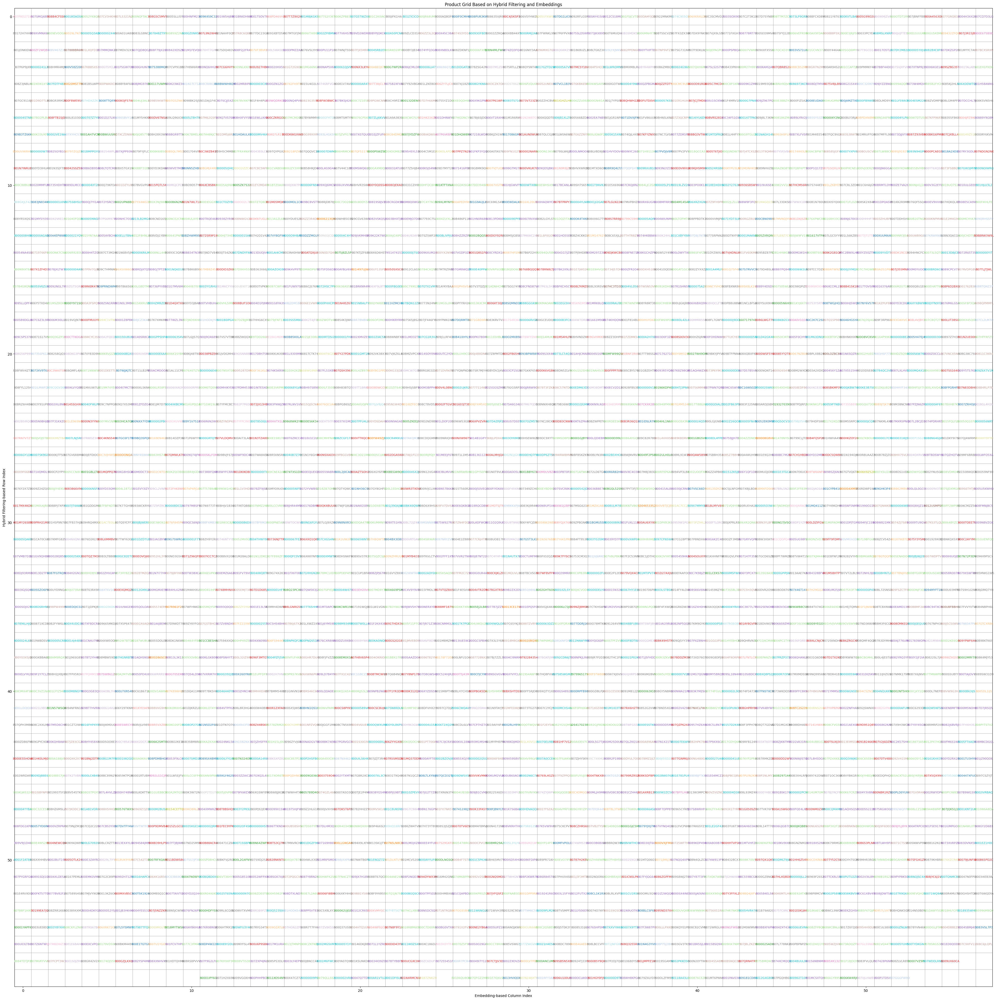

In [7]:
import csv
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
import random
import matplotlib.patches as mpatches
from heapq import heappush, heappop


# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)
csv_file = "amazon_reviews.csv"

# Read the CSV data and create a dictionary of products
products_dict = {}
with open(csv_file, mode='r', encoding='utf-8') as file:
    csv_reader = csv.DictReader(file)
    for row in csv_reader:
        # Extract and clean the rating_count
        try:
            rating_count = int(row['rating_number'].replace(',', '')) if row['rating_number'] else 0
        except ValueError:
            rating_count = 0

        # Extract and clean the rating
        try:
            rating = float(row['average_rating'])
        except ValueError:
            rating = 0.0

        # Create a dictionary for each product
        product_details = {
            'product_id': row['parent_asin'],
            'product_name': row['title'],
            'category': row['main_category'],
            'rating': rating,
            'rating_count': rating_count,
            'about_product': row['description'],
            'bought_together': row['bought_together']
        }
        # Use parent_asin as the key for the products dictionary
        products_dict[row['parent_asin']] = product_details

# Print available product IDs
print("Available product IDs:", list(products_dict.keys())[:10])  # Print first 10 product IDs for checking

# Construct the grid
num_products = len(products_dict)
grid_size = int(np.ceil(np.sqrt(num_products)))
grid = np.empty((grid_size, grid_size), dtype=object)

# Calculate row indices using hybrid filtering
categories = np.array([p['category'] for p in products_dict.values()]).reshape(-1, 1)
category_encoded = encoder.fit_transform(categories)

features = np.array([[p['rating'], p['rating_count']] for p in products_dict.values()])
features = np.concatenate((category_encoded, features), axis=1)

scaler = MinMaxScaler()
row_indices = scaler.fit_transform(features)

# Calculate column indices using Word2Vec embeddings for better semantic similarity
corpus = [p['about_product'].split() for p in products_dict.values()]
word2vec_model = Word2Vec(sentences=corpus, vector_size=50, window=5, min_count=1, workers=4)
product_vectors = np.array([np.mean([word2vec_model.wv[word] for word in words if word in word2vec_model.wv]
                                    or [np.zeros(50)], axis=0) for words in corpus])

column_indices = scaler.fit_transform(product_vectors)

# Normalize indices to fit within grid size
row_indices = (row_indices[:, 0] * (grid_size - 1)).astype(int)
column_indices = (column_indices[:, 0] * (grid_size - 1)).astype(int)

# Shuffle the product IDs to ensure a random distribution
product_ids = list(products_dict.keys())
random.shuffle(product_ids)

# Place products in the grid based on normalized indices
for idx, product_id in enumerate(product_ids):
    row = row_indices[idx]
    col = column_indices[idx]
    while grid[row, col] is not None:
        col = (col + 1) % grid_size
        if col == 0:
            row = (row + 1) % grid_size
    grid[row, col] = product_id
    print(f"Product ID: {product_id}, Row: {row}, Column: {col}")

def calculate_similarity(product1, product2):
    vectorizer = TfidfVectorizer()
    text_vectors = vectorizer.fit_transform([product1['about_product'], product2['about_product']])
    cosine_sim = cosine_similarity(text_vectors[0:1], text_vectors[1:2])[0][0]
    rating_similarity = min(product1['rating'], product2['rating']) / max(product1['rating'], product2['rating'])
    
    # Check if either rating count is zero to avoid division by zero
    if product1['rating_count'] == 0 or product2['rating_count'] == 0:
        rating_count_similarity = 0
    else:
        rating_count_similarity = min(product1['rating_count'], product2['rating_count']) / max(product1['rating_count'], product2['rating_count'])
    
    similarity_score = cosine_sim + rating_similarity + rating_count_similarity
    return similarity_score


def a_star_search_recommendations(start, grid, products_dict, max_recommendations=10):
    def heuristic(product1, product2):
        return calculate_similarity(products_dict[product1], products_dict[product2])

    open_set = []
    heappush(open_set, (0, start))
    came_from = {}
    g_score = {product: float('inf') for row in grid for product in row if product}
    g_score[start] = 0
    f_score = {product: float('inf') for row in grid for product in row if product}
    f_score[start] = 0

    recommendations = []
    while open_set and len(recommendations) < max_recommendations:
        _, current = heappop(open_set)
        if current not in recommendations:
            recommendations.append(current)
        for row in grid:
            for neighbor in row:
                if neighbor and neighbor != current:
                    tentative_g_score = g_score[current] + calculate_similarity(products_dict[current], products_dict[neighbor])
                    if tentative_g_score < g_score[neighbor]:
                        came_from[neighbor] = current
                        g_score[neighbor] = tentative_g_score
                        f_score[neighbor] = g_score[neighbor] + heuristic(neighbor, current)
                        heappush(open_set, (f_score[neighbor], neighbor))


    return recommendations

# Choose a valid start product ID from the printed list
start_product_id = "B071H2X69R"  # Use the first available product ID
recommendations = a_star_search_recommendations(start_product_id, grid, products_dict, max_recommendations=10)
print("Recommended products:", recommendations)

# Visualization with improved clarity
plt.figure(figsize=(50, 50))
plt.imshow(np.full((grid_size, grid_size), np.nan), cmap='viridis', interpolation='none')  # Empty grid
plt.title('Product Grid Based on Hybrid Filtering and Embeddings')

# Define colors for categories
categories_unique = list(set(p['category'] for p in products_dict.values()))
category_colors = {category: plt.cm.tab20(i / len(categories_unique)) for i, category in enumerate(categories_unique)}

for i in range(grid_size):
    plt.axhline(i - 0.5, color='gray', linewidth=0.5)
    plt.axvline(i - 0.5, color='gray', linewidth=0.5)

for (row, col), product_id in np.ndenumerate(grid):
    if product_id is not None:
        category = products_dict[product_id]['category']
        color = category_colors[category]
        plt.text(col, row, product_id, ha='center', va='center', fontsize=8, color=color)


    

# Create legend
# legend_patches = [mpatches.Patch(color=color, label=category) for category, color in category_colors.items()]
# plt.legend(handles=legend_patches, loc='upper left', bbox_to_anchor=(1, 1))

plt.xlabel('Embedding-based Column Index')
plt.ylabel('Hybrid Filtering-based Row Index')
plt.grid(False)
plt.show()

Recommended products:
Product ID: B071H2X69R, Title: Chenhon Fridge Handle Cover-Catches Drips,Door Cloth Protector,(1 Pair) (Green), Category: Amazon Home
Product ID: 0979965179, Title: Hair 900 DVD DEMO For Practice, Category: Software
Product ID: 1264170238, Title: Drugs, Society, and Human Behavior - Connect Access - 18th Edition, Category: Software
Product ID: B00062UJGC, Title: Boohbah Wiggle & Giggle (PC & Mac), Category: Software
Product ID: B001BBY67A, Title: OmniForm 3.0, Category: Software
Product ID: B0031Q6DBU, Title: Amscan Dinner Plates 9' 24/Pkg Clear Plastic, Category: Amazon Home
Product ID: B0042SSZ5S, Title: Sax Sloyd Half-Beveled Knife, Black, 2-1/2" Blade Length, Category: Industrial & Scientific
Product ID: B0046HGSYA, Title: PTWN6050MWT General Electric GE Profile(TM) 3.6 DOE cu. ft. stainless steel capacity washer, Category: Appliances
Product ID: B0047N0WYU, Title: Prevx Cloud Anti-Malware 3.0 - 1 User, Category: Software
Product ID: B004L1871S, Title: Secret 

KeyError: None

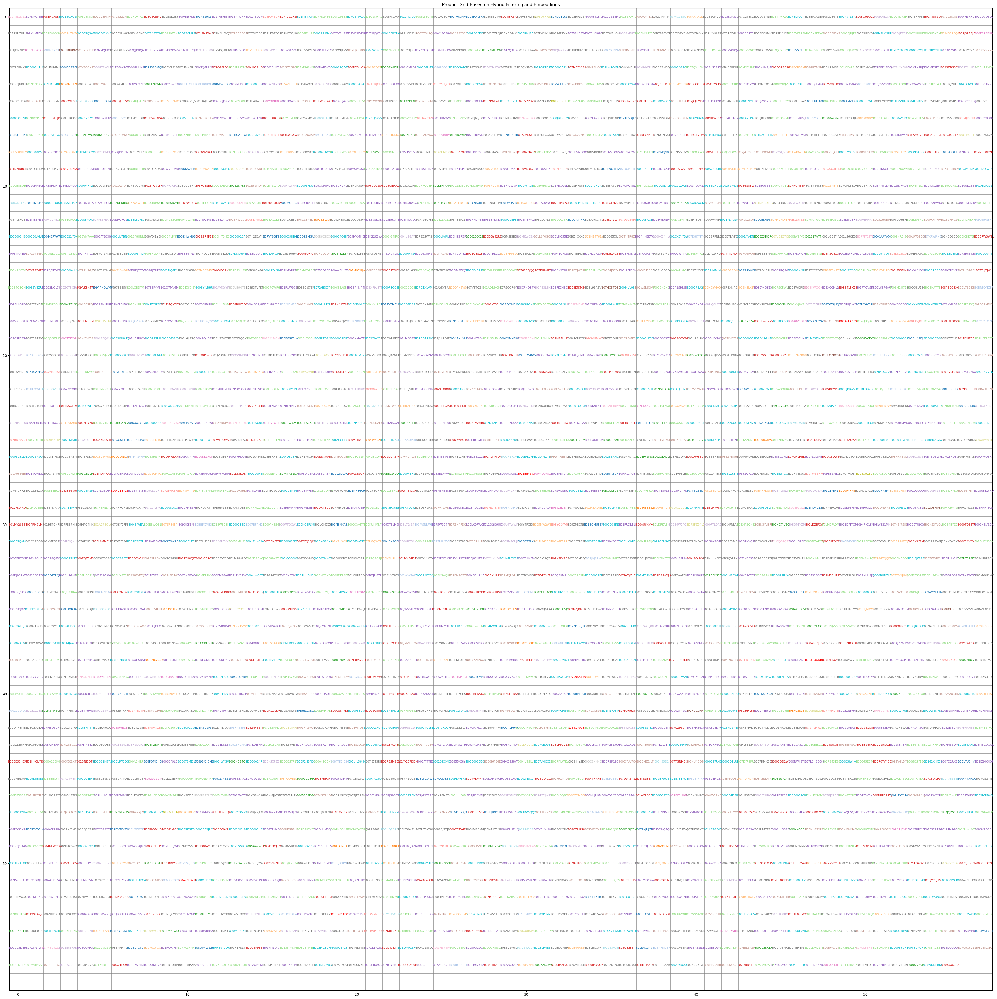

In [9]:
def get_product_details(product_id):
    product = products_dict.get(product_id)
    if product:
        return product['product_name'], product['category']
    else:
        return None, None


print("Recommended products:")
for rec in recommendations:
    product_name, category = get_product_details(rec)
    if product_name and category:
        print(f"Product ID: {rec}, Title: {product_name}, Category: {category}")

# Visualization with improved clarity
plt.figure(figsize=(50, 50))
plt.imshow(np.full((grid_size, grid_size), np.nan), cmap='viridis', interpolation='none')  # Empty grid
plt.title('Product Grid Based on Hybrid Filtering and Embeddings')

# Define colors for categories
categories_unique = list(set(p['category'] for p in products_dict.values()))
category_colors = {category: plt.cm.tab20(i / len(categories_unique)) for i, category in enumerate(categories_unique)}

for i in range(grid_size):
    plt.axhline(i - 0.5, color='gray', linewidth=0.5)
    plt.axvline(i - 0.5, color='gray', linewidth=0.5)

# Highlight recommended products
for (row, col), product_id in np.ndenumerate(grid):
    if product_id in recommendations:
        category = products_dict[product_id]['category']
        color = category_colors[category]
        plt.text(col, row, product_id, ha='center', va='center', fontsize=8, color='red')  # Highlight in red
    else:
        category = products_dict[product_id]['category']
        color = category_colors[category]
        plt.text(col, row, product_id, ha='center', va='center', fontsize=8, color=color)

# Create legend
legend_patches = [mpatches.Patch(color=color, label=category) for category, color in category_colors.items()]
plt.legend(handles=legend_patches, loc='upper left', bbox_to_anchor=(1, 1))

plt.xlabel('Embedding-based Column Index')
plt.ylabel('Hybrid Filtering-based Row Index')
plt.grid(False)
plt.show()